# Import Package

In [2]:
#coding=utf-8 
import re, json, requests, time, datetime
import pandas as pd
import numpy as np
import io, json
from bs4 import BeautifulSoup

import sys
import os
from os import path
import jieba
import jieba.analyse as analyse
from collections import Counter
from wordcloud import WordCloud
from matplotlib import pyplot as plt
%matplotlib inline
from PIL import Image

# Web Page

In [3]:
rs=requests.session()
requests.packages.urllib3.disable_warnings()

choose a ptt website

In [4]:
url = "https://www.ptt.cc/bbs/NBA/M.1545356424.A.572.html"

In [5]:
def over18(PttName):
    # over 18
    load={
        'from':'/bbs/'+PttName+'/index.html',
        'yes':'yes' 
    }
    res=rs.post('https://www.ptt.cc/ask/over18',verify=False,data=load)
over18(url.replace("https://www.ptt.cc/bbs/", "").split("/")[0])

In [6]:
web = rs.get(url, timeout=60)
soup = BeautifulSoup(web.text,'html.parser')

In [7]:
# author
author = soup.select('.article-meta-value')[0].text
#author = soup.find("span", {'class': 'article-meta-value'}).text
print("AUTHOR: \n", author)

AUTHOR: 
 Gotham (萬惡之城)


In [8]:
# title
title = soup.select('.article-meta-value')[2].text
print("TITLE: \n", title)

TITLE: 
 [新聞] 林書豪交易傳聞再起 　奧蘭多魔術有興趣


In [9]:
# date
date = soup.select('.article-meta-value')[3].text
print("DATE: \n", date)

DATE: 
 Fri Dec 21 09:40:21 2018


In [10]:
# ip       
try:
    targetIP=u'※ 發信站: 批踢踢實業坊'
    ip =  soup.find(string = re.compile(targetIP))
    ip = re.search(r"[0-9]*\.[0-9]*\.[0-9]*\.[0-9]*",ip).group()
except:
    ip = "ip is not find"
print("IP: \n", ip)

IP: 
 101.137.101.35


In [11]:
# content
content = soup.find(id="main-content").text
target_content=u'※ 發信站: 批踢踢實業坊(ptt.cc),'
content = content.split(target_content)
content = content[0].split(date)
main_content = content[1].replace('\n', '  ').replace('\t', '  ')
print("CONTENT: \n", main_content)

CONTENT: 
   林書豪交易傳聞再起 　奧蘭多魔術有興趣      林書豪日前傳聞交易到西區球隊破局，今天又傳出魔術對林書豪有興趣。    根據消息，林書豪在黃蜂隊擔任教練的克里夫Steve Clifford，目前是魔術總教練，推測  是對林書豪表達興趣因素之一。本季林書豪在老鷹出賽26場，場均10.8分和3.1次助攻，  今年是他合約最後一年，年薪1200萬美元(約3.7億台幣)，老鷹本季打算擺爛，林書豪未  能配合球隊政策，遭懷疑是傳出交易主因。    林書豪NBA生涯從2010年開始，至今已待過7支球隊。    (陳國偉／綜合報導)    新聞網址  https://tw.sports.appledaily.com/realtime/20181221/1487342/      --  


In [12]:
# message
num, push, dislike, neutral, message = 0,0,0,0,{}
for tag in soup.select('div.push'):
    num += 1
    push_tag = tag.find("span", {'class': 'push-tag'}).text
    push_userid = tag.find("span", {'class': 'push-userid'}).text       
    push_content = str(tag.find("span", {'class': 'push-content'}).text)[1:]
    push_ipdatetime = tag.find("span", {'class': 'push-ipdatetime'}).text
    push_ipdatetime = push_ipdatetime.replace("\n","")
    message[num]={"tag":push_tag,"user":push_userid,"content":push_content,"time":push_ipdatetime}
    if '推' in str(push_tag):
        push += 1
    elif '→' in str(push_tag):
        neutral += 1
    else:
        dislike += 1

In [13]:
print("TOTAL_COMMENT_COUNT: \n", num)

TOTAL_COMMENT_COUNT: 
 157


In [14]:
print("PUSH_COUNT: \n", push)

PUSH_COUNT: 
 96


In [15]:
print("NEUTRAL_COUNT: \n", neutral)

NEUTRAL_COUNT: 
 59


In [16]:
print("DISLIKE_COUNT: \n", dislike)

DISLIKE_COUNT: 
 2


In [17]:
print("COMMENTS:")
for k in message:
    print(message[k], "\n", "="*80)

COMMENTS:
{'tag': '推 ', 'user': 'TravisShaw  ', 'content': ' 魔術林', 'time': ' 12/21 09:41'} 
{'tag': '推 ', 'user': 'Wb2029T     ', 'content': ' 又有新成就了嗎？', 'time': ' 12/21 09:42'} 
{'tag': '推 ', 'user': 'peter89000  ', 'content': ' 魔術要拿誰還換阿？', 'time': ' 12/21 09:43'} 
{'tag': '推 ', 'user': 'AlanLinKL   ', 'content': ' 魔術球衣可以啊啊啊', 'time': ' 12/21 09:43'} 
{'tag': '推 ', 'user': 'arashicool  ', 'content': ' 有迪士尼的球衣可以穿了', 'time': ' 12/21 09:43'} 
{'tag': '推 ', 'user': 'ZachBritton ', 'content': ' 認真打球=未能配合球隊政策', 'time': ' 12/21 09:44'} 
{'tag': '→ ', 'user': 'tindy       ', 'content': ' 消息源是哪', 'time': ' 12/21 09:44'} 
{'tag': '推 ', 'user': 'LBJGod      ', 'content': ' 可以去一些有季後賽的隊伍嗎', 'time': ' 12/21 09:46'} 
{'tag': '→ ', 'user': 'LBJGod      ', 'content': ' 根本是在愚弄我豪', 'time': ' 12/21 09:46'} 
{'tag': '推 ', 'user': 'phix        ', 'content': ' 書豪合約年 怎麼能擺爛', 'time': ' 12/21 09:49'} 
{'tag': '推 ', 'user': 'hsienhao    ', 'content': ' 藍色球衣收集過了嗎', 'time': ' 12/21 09:49'} 
{'tag': '推 ', 'user': 

In [18]:
page_data = {"url":url,
              "author":author,
              "title":title,
              "time":date,
              "ip":ip,
              "content":main_content,
              "comments":message,
              "push":push,
              "dislike":dislike,
              "neutral":neutral,
              "all":num}

In [19]:
page_list = [["url","time","title","author","ip","content","all_comment_count","push_count","neutral_count","dislike_count","comment_status","comment_time","comment_user","comment_content"]]
for k in page_data["comments"]:
    page_list.append([page_data["url"],page_data["time"],page_data["title"],page_data["author"],page_data["ip"],page_data["content"],page_data["all"],page_data["push"],page_data["neutral"],page_data["dislike"],page_data["comments"][k]["tag"],page_data["comments"][k]["time"],page_data["comments"][k]["user"],page_data["comments"][k]["content"]])
page_df = pd.DataFrame(page_list[1:], columns=page_list[0])

# Board

In [20]:
rs=requests.session()
requests.packages.urllib3.disable_warnings()

def over18(PttName):
    # over 18
    load={
        'from':'/bbs/'+PttName+'/index.html',
        'yes':'yes' 
    }
    res=rs.post('https://www.ptt.cc/ask/over18',verify=False,data=load)

def PageCount(PttName):
    # get index page number
    res=rs.get('https://www.ptt.cc/bbs/'+PttName+'/index.html',verify=False, timeout=60)
    soup=BeautifulSoup(res.text,'html.parser')
    ALLpageURL = soup.select('.btn.wide')[1]['href']
    ALLpage=int(getPageNumber(ALLpageURL))+1
    return  ALLpage
    
def getPageNumber(content):
    # get article url id number
    startIndex = content.find('index')
    endIndex = content.find('.html')
    pageNumber = content[startIndex+5 : endIndex]
    return pageNumber

def parse_article(link , g_id):
    print("parsing: %s" % link)
    res=rs.get(link,verify=False, timeout=60)
    soup = BeautifulSoup(res.text,'html.parser')
    # author
    author  = soup.select('.article-meta-value')[0].text
    #author = soup.find("span", {'class': 'article-meta-value'}).text              
    # title
    title = soup.select('.article-meta-value')[2].text
    # date
    date = soup.select('.article-meta-value')[3].text
    # ip       
    try:
        targetIP=u'※ 發信站: 批踢踢實業坊'
        ip =  soup.find(string = re.compile(targetIP))
        ip = re.search(r"[0-9]*\.[0-9]*\.[0-9]*\.[0-9]*",ip).group()
    except:
        ip = "ip is not find"

    # content
    content = soup.find(id="main-content").text
    target_content=u'※ 發信站: 批踢踢實業坊(ptt.cc),'
    content = content.split(target_content)
    content = content[0].split(date)
    main_content = content[1].replace('\n', '  ').replace('\t', '  ')

    # message
    num, push, dislike, neutral, message = 0,0,0,0,{}
    for tag in soup.select('div.push'):
        num += 1
        push_tag = tag.find("span", {'class': 'push-tag'}).text
        push_userid = tag.find("span", {'class': 'push-userid'}).text       
        push_content = str(tag.find("span", {'class': 'push-content'}).text)[1:]
        push_ipdatetime = tag.find("span", {'class': 'push-ipdatetime'}).text
        push_ipdatetime = push_ipdatetime.replace("\n","")
        message[num]={"tag":push_tag,"user":push_userid,"content":push_content,"time":push_ipdatetime}
        if '推' in str(push_tag):
            push += 1
        elif '→' in str(push_tag):
            neutral += 1
        else:
            dislike += 1    
    dic={"url":link,"author":author,"title":title,"time":date,"ip":ip,"content":main_content,"comments":message,"push":push,"dislike":dislike,"neutral":neutral,"all":num}
#     json_data = json.dumps(dic, ensure_ascii=False,indent=4,sort_keys=True)
    return dic

def crawler(PttName, ParsingPage):
    print ('Start parsing [',PttName,']....')
    ALLpage=PageCount(PttName)
    g_id = 0
    result_list = []
    for number in range(ALLpage, ALLpage-int(ParsingPage),-1):
        url = 'https://www.ptt.cc/bbs/'+PttName+'/index'+str(number)+'.html'
        print(url)
        res = rs.get(url,verify=False, timeout=60)
        soup = BeautifulSoup(res.text,'html.parser')
        for tag in soup.select('div.title'):
            try:
                atag=tag.find('a')
                time.sleep(2)
                if(atag):
                    URL=atag['href']
                    link='https://www.ptt.cc'+URL
                g_id = g_id+1
                tmp_dic = parse_article(link, g_id)
                result_list.append(tmp_dic)
            except Exception as e:
                print(str(e))
    return result_list

In [21]:
# setting
PttName="Gossiping"
ParsingPage = 1

In [22]:
# crawler
over18(PttName)
board_data = crawler(PttName,ParsingPage)

Start parsing [ Gossiping ]....
https://www.ptt.cc/bbs/Gossiping/index39451.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1603474538.A.067.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1603474599.A.AFE.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1603474763.A.79A.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1603474805.A.381.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1603474836.A.0BB.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1602345605.A.248.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1602399932.A.4F8.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1602061055.A.748.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1603254652.A.B10.html
parsing: https://www.ptt.cc/bbs/Gossiping/M.1603382657.A.7F3.html


In [23]:
board_df = pd.DataFrame(board_data, columns=["time", "url", "author", "title", "ip", "content", "all", "push", "neutral", "dislike"])

# Check your Data

Structured Data: DataFrame

In [24]:
page_df.head()

,url,time,title,author,ip,content,all_comment_count,push_count,neutral_count,dislike_count,comment_status,comment_time,comment_user,comment_content
0,https://www.ptt.cc/bbs/NBA/M.1545356424.A.572....,Fri Dec 21 09:40:21 2018,[新聞] 林書豪交易傳聞再起 奧蘭多魔術有興趣,Gotham (萬惡之城),101.137.101.35,林書豪交易傳聞再起 奧蘭多魔術有興趣 林書豪日前傳聞交易到西區球隊破局，今天...,157,96,59,2,推,12/21 09:41,TravisShaw,魔術林
1,https://www.ptt.cc/bbs/NBA/M.1545356424.A.572....,Fri Dec 21 09:40:21 2018,[新聞] 林書豪交易傳聞再起 奧蘭多魔術有興趣,Gotham (萬惡之城),101.137.101.35,林書豪交易傳聞再起 奧蘭多魔術有興趣 林書豪日前傳聞交易到西區球隊破局，今天...,157,96,59,2,推,12/21 09:42,Wb2029T,又有新成就了嗎？
2,https://www.ptt.cc/bbs/NBA/M.1545356424.A.572....,Fri Dec 21 09:40:21 2018,[新聞] 林書豪交易傳聞再起 奧蘭多魔術有興趣,Gotham (萬惡之城),101.137.101.35,林書豪交易傳聞再起 奧蘭多魔術有興趣 林書豪日前傳聞交易到西區球隊破局，今天...,157,96,59,2,推,12/21 09:43,peter89000,魔術要拿誰還換阿？
3,https://www.ptt.cc/bbs/NBA/M.1545356424.A.572....,Fri Dec 21 09:40:21 2018,[新聞] 林書豪交易傳聞再起 奧蘭多魔術有興趣,Gotham (萬惡之城),101.137.101.35,林書豪交易傳聞再起 奧蘭多魔術有興趣 林書豪日前傳聞交易到西區球隊破局，今天...,157,96,59,2,推,12/21 09:43,AlanLinKL,魔術球衣可以啊啊啊
4,https://www.ptt.cc/bbs/NBA/M.1545356424.A.572....,Fri Dec 21 09:40:21 2018,[新聞] 林書豪交易傳聞再起 奧蘭多魔術有興趣,Gotham (萬惡之城),101.137.101.35,林書豪交易傳聞再起 奧蘭多魔術有興趣 林書豪日前傳聞交易到西區球隊破局，今天...,157,96,59,2,推,12/21 09:43,arashicool,有迪士尼的球衣可以穿了


In [25]:
board_df.head()

,time,url,author,title,ip,content,all,push,neutral,dislike
0,Sat Oct 24 01:35:36 2020,https://www.ptt.cc/bbs/Gossiping/M.1603474538....,ishdtt598 (無止盡的夢是可以駕著砲Q),[問卦] 欸欸 為什麼小傑要找爸爸,49.216.41.38,小傑從沒看過媽媽 然後爸爸從小就把他丟給米特阿姨 蟻王打完差點死掉的時候 金也...,0,0,0,0
1,Sat Oct 24 01:36:37 2020,https://www.ptt.cc/bbs/Gossiping/M.1603474599....,lbjcavs2016 (喵布),[問卦] Just Kidding Funfire? 這句怎麼翻？,123.204.136.172,各位30公分F女郎安安 就是啊 半夜睡不著啦 再過陣子英文要段考啦 突然想複習一下...,0,0,0,0
2,Sat Oct 24 01:39:21 2020,https://www.ptt.cc/bbs/Gossiping/M.1603474763....,angellll (長尾巴的天使),Re: [問卦] 川普會把黑川電視台撤照嗎(歪頭),118.160.84.175,※ 引述《alchemist106 (傳說中的煉金術師)》之銘言： : Hey Hey...,0,0,0,0
3,Sat Oct 24 01:40:03 2020,https://www.ptt.cc/bbs/Gossiping/M.1603474805....,kevin77605 (),[問卦] 現實中 美國總統開飛機的八卦,223.137.158.109,美國目前被公認為軍事世界首強 但如果遇到不可預知的敵人入侵 導致戰鬥到最...,0,0,0,0
4,Sat Oct 24 01:40:34 2020,https://www.ptt.cc/bbs/Gossiping/M.1603474836....,notfound0506 (存在の証明),[問卦] 周星馳的哪部電影最有梗,182.233.140.61,小弟小時候看少林足球 現在正在複習 星爺的電影我看的不多 （聽說他很機車 不...,0,0,0,0


Semi-structured Data: Json

In [26]:
page_data

{'url': 'https://www.ptt.cc/bbs/NBA/M.1545356424.A.572.html',
 'author': 'Gotham (萬惡之城)',
 'title': '[新聞] 林書豪交易傳聞再起 \u3000奧蘭多魔術有興趣',
 'time': 'Fri Dec 21 09:40:21 2018',
 'ip': '101.137.101.35',
 'content': '  林書豪交易傳聞再起 \u3000奧蘭多魔術有興趣      林書豪日前傳聞交易到西區球隊破局，今天又傳出魔術對林書豪有興趣。    根據消息，林書豪在黃蜂隊擔任教練的克里夫Steve Clifford，目前是魔術總教練，推測  是對林書豪表達興趣因素之一。本季林書豪在老鷹出賽26場，場均10.8分和3.1次助攻，  今年是他合約最後一年，年薪1200萬美元(約3.7億台幣)，老鷹本季打算擺爛，林書豪未  能配合球隊政策，遭懷疑是傳出交易主因。    林書豪NBA生涯從2010年開始，至今已待過7支球隊。    (陳國偉／綜合報導)    新聞網址  https://tw.sports.appledaily.com/realtime/20181221/1487342/      --  ',
 'comments': {1: {'tag': '推 ',
   'user': 'TravisShaw  ',
   'content': ' 魔術林',
   'time': ' 12/21 09:41'},
  2: {'tag': '推 ',
   'user': 'Wb2029T     ',
   'content': ' 又有新成就了嗎？',
   'time': ' 12/21 09:42'},
  3: {'tag': '推 ',
   'user': 'peter89000  ',
   'content': ' 魔術要拿誰還換阿？',
   'time': ' 12/21 09:43'},
  4: {'tag': '推 ',
   'user': 'AlanLinKL   ',
   'content': ' 魔術球衣可以啊啊啊',
   'time': ' 12/21 09:43'},
  5: {'tag': '推 ',
   'user

In [27]:
board_data[0]

{'url': 'https://www.ptt.cc/bbs/Gossiping/M.1603474538.A.067.html',
 'author': 'ishdtt598 (無止盡的夢是可以駕著砲Q)',
 'title': '[問卦] 欸欸 為什麼小傑要找爸爸',
 'time': 'Sat Oct 24 01:35:36 2020',
 'ip': '49.216.41.38',
 'content': '    小傑從沒看過媽媽  然後爸爸從小就把他丟給米特阿姨  蟻王打完差點死掉的時候  金也不聞不問  有一個這麼不負責任的爸爸  為什麼不跟凱特好好學  小傑為什麼千辛萬苦還要去找爸爸        -----  Sent from JPTT on my Google Pixel 4.    --  ',
 'comments': {},
 'push': 0,
 'dislike': 0,
 'neutral': 0,
 'all': 0}

# Write in File

In [28]:
def to_excel(df, file_name):
    # excel
    writer = pd.ExcelWriter(file_name+".xlsx")
    df.to_excel(writer,'Sheet1', index = False)
    writer.save()
def to_csv(df, file_name):
    # csv
    df[list(df.columns)].to_csv(file_name+".csv", sep='|', encoding='utf-8')
def to_json(result_list, file_name):
    # json
    with io.open(file_name+".json", 'w', encoding='utf-8') as f:
        f.write(json.dumps(result_list, ensure_ascii=False))

In [29]:
file_name = "output/PTT_crawler_page_data"
to_excel(page_df, file_name)
to_csv(page_df, file_name)
to_json(page_data, file_name)

In [30]:
file_name = "output/PTT_crawler_board_data"
to_excel(board_df, file_name)
to_csv(board_df, file_name)
to_json(board_data, file_name)

# Short Visualization

In [31]:
shortv_df = board_df[["time", "all", "push", "neutral", "dislike"]]

In [32]:
shortv_df["time"] = shortv_df["time"].apply(lambda x: datetime.datetime.strptime(str(x),"%a %b %d %H:%M:%S %Y"))

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [33]:
shortv_df["year"] = shortv_df["time"].apply(lambda x: x.year)
shortv_df["month"] = shortv_df["time"].apply(lambda x: x.month)
shortv_df["day"] = shortv_df["time"].apply(lambda x: x.day)
shortv_df["hour"] = shortv_df["time"].apply(lambda x: x.hour)
shortv_df["minute"] = shortv_df["time"].apply(lambda x: x.minute)
shortv_df["second"] = shortv_df["time"].apply(lambda x: x.second)
shortv_df["weekday"] = shortv_df["time"].apply(lambda x: x.isoweekday())

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.

In [34]:
shortv_df.head()

,time,all,push,neutral,dislike,year,month,day,hour,minute,second,weekday
0,2020-10-24 01:35:36,0,0,0,0,2020,10,24,1,35,36,6
1,2020-10-24 01:36:37,0,0,0,0,2020,10,24,1,36,37,6
2,2020-10-24 01:39:21,0,0,0,0,2020,10,24,1,39,21,6
3,2020-10-24 01:40:03,0,0,0,0,2020,10,24,1,40,3,6
4,2020-10-24 01:40:34,0,0,0,0,2020,10,24,1,40,34,6


In [35]:
def get_pre_pic(shortv_df, time_col_name, ck_col_name):
    x = []
    if "hour" in time_col_name:
        x = range(1, 24+1)
    elif "minute" in time_col_name:
        x = range(1, 60+1)
    elif "second" in time_col_name:
        x = range(1, 60+1)
    elif "weekday" in time_col_name:
        x = range(1, 7+1)
    elif "day" in time_col_name:
        x = range(1, 31+1)
    elif "month" in time_col_name:
        x = range(1, 12+1)
    else:
        return "please check your time column name"
    
    df_dic = {}
    if (ck_col_name == "all") or (ck_col_name == "push") or (ck_col_name == "neutral") or (ck_col_name == "dislike"):
        for k in np.array(shortv_df[[time_col_name, ck_col_name]]):
            if k[0] not in df_dic:
                df_dic[k[0]] = int(k[1])
            else:
                df_dic[k[0]] += int(k[1])
    else:
        return "please check your value column name"

    pic_array = []
    for k in x:
        if k in df_dic:
            pic_array.append([k, df_dic[k]])
        else:
            pic_array.append([k, 0])
    return np.array(pic_array)

choose Time and Count_number

In [36]:
# Count_number: all, push, neutral, dislike
# Time: month, day, hour, minute, second, weekday
dfarray = get_pre_pic(shortv_df, "hour", "all")

<BarContainer object of 24 artists>

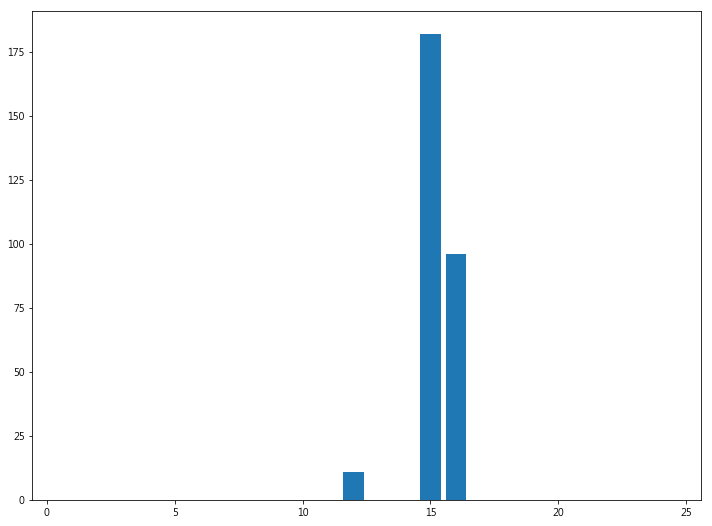

In [37]:
plt.figure(figsize = (12,9))
plt.bar(dfarray[:,0], dfarray[:,1])

# Word Cloud

preparation

In [38]:
raw_text = list(board_df["title"] + board_df["content"])

In [39]:
jieba.set_dictionary('dict/dict.big.txt')
with open('dict/stopwords.txt', 'r', encoding='utf8') as f:
    stops = f.read().split('\n')

In [40]:
raw_text_dic = {}
for line in raw_text:
    line = line.strip('\n')
    words = jieba.cut(line, cut_all=False)
    for word in words:
        if word not in stops:
            if len(word) > 1:
                word = str(word).strip().replace("\n", "").replace("\r", "").replace(" ", "")
                if word not in raw_text_dic:
                    raw_text_dic[word] = 1
                else:
                    raw_text_dic[word] += 1

Building prefix dict from C:\Users\charl\python-crawler\ptt-notebook\dict\dict.big.txt ...
Dumping model to file cache C:\Users\charl\AppData\Local\Temp\jieba.u2ca72f738f32c77cef0f91b40e21f596.cache
Loading model cost 1.298 seconds.
Prefix dict has been built successfully.


get wordcloud

In [41]:
alice_mask = np.array(Image.open("img/cloud_mask7.png"))
wc = WordCloud(background_color="white", max_words=2000, mask=alice_mask, font_path="font/msjh.ttc", width=2400, height=2400)
wc.generate_from_frequencies(raw_text_dic)

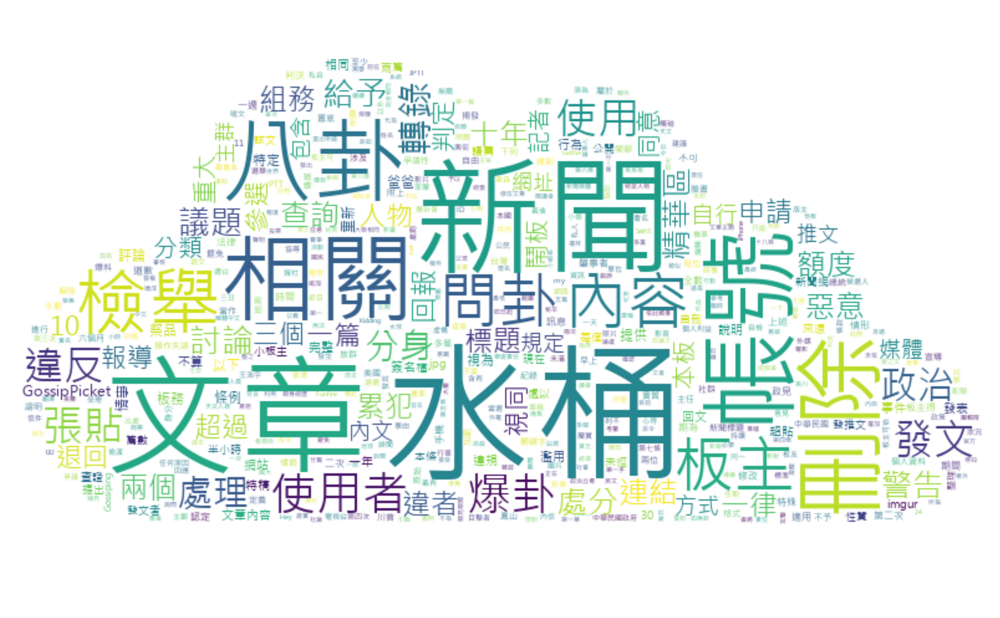

In [42]:
# show
plt.rcParams["figure.figsize"] = (200,100)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

In [43]:
# save img
picture_name = "img/wordcloud.png"
wc.to_file(picture_name)